<a href="https://colab.research.google.com/github/hyunkyung31/DeepLearningProject/blob/main/jiyoung/CADICA_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. 환경 설정 및 데이터확인
2. Detection Dataset 생성
3. YOLO Baseline
4. Baseline 개선 실험
5. 데이터 증강
6. 증강 데이터 학습
7. Hyperparameter Tuning
8. Two-stage Learning
9. YOLOv12

In [ ]:
!pip install ultralytics

In [ ]:
# 라이브러리 import
import os
from pathlib import Path # 파일경로 관리
import pandas as pd # 데이터 처리
import numpy as np
from PIL import Image # 이미지 처리
from tqdm import tqdm # 진행률 표시
import shutil

In [ ]:
# 프로젝트 폴더
PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")

# CADICA 데이터셋
CADICA_DIR = PROJECT_DIR / "CADICA"

# 공통 Split CSV
CSV_PATH = PROJECT_DIR / "common_split.csv"

# 전처리 결과 저장 폴더
OUTPUT_DIR = PROJECT_DIR / "09_detection_dataset"

# 출력 폴더 생성
OUTPUT_DIR.mkdir(exist_ok=True)

# 경로 확인
print(f"📂 Project : {PROJECT_DIR}")
print(f"📂 CADICA  : {CADICA_DIR}")
print(f"📄 CSV     : {CSV_PATH}")
print(f"📁 Output  : {OUTPUT_DIR}")

📂 Project : /content/drive/MyDrive/DL_project
📂 CADICA  : /content/drive/MyDrive/DL_project/CADICA
📄 CSV     : /content/drive/MyDrive/DL_project/common_split.csv
📁 Output  : /content/drive/MyDrive/DL_project/09_detection_dataset


In [ ]:
print("PROJECT_DIR :", PROJECT_DIR.exists())
print("CADICA_DIR  :", CADICA_DIR.exists())
print("CSV_PATH    :", CSV_PATH.exists())
print("OUTPUT_DIR  :", OUTPUT_DIR.exists())

PROJECT_DIR : True
CADICA_DIR  : True
CSV_PATH    : True
OUTPUT_DIR  : True


# CADICA 데이터셋 확인

In [ ]:
# common_split
df = pd.read_csv(CSV_PATH)
print("csv 로드 완료")

csv 로드 완료


In [ ]:
df.head()

,patient_id,video_id,label,view,n_frames,has_groundtruth,split
0,p1,v2,lesion,LCA,56,True,train
1,p1,v3,lesion,LCA,44,True,train
2,p1,v10,lesion,LCA,56,True,train
3,p1,v11,lesion,LCA,44,True,train
4,p1,v1,non-lesion,LCA,55,False,train


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334 entries, 0 to 333
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   patient_id       334 non-null    object
 1   video_id         334 non-null    object
 2   label            334 non-null    object
 3   view             334 non-null    object
 4   n_frames         334 non-null    int64 
 5   has_groundtruth  334 non-null    bool  
 6   split            334 non-null    object
dtypes: bool(1), int64(1), object(5)
memory usage: 16.1+ KB


In [ ]:
print(f"총 Video 개수 : {len(df)}")
print(f"총 컬럼 개수 : {len(df.columns)}")

print("\n컬럼 목록")
print(df.columns.tolist())

총 Video 개수 : 334
총 컬럼 개수 : 7

컬럼 목록
['patient_id', 'video_id', 'label', 'view', 'n_frames', 'has_groundtruth', 'split']


In [ ]:
selected_dir = CADICA_DIR / "selectedVideos"

print("selectedVideos 존재 여부 :", selected_dir.exists())

# 환자 폴더 일부 출력
print("\n환자 폴더 예시")
print(sorted(os.listdir(selected_dir))[:5])

selectedVideos 존재 여부 : True

환자 폴더 예시
['p1', 'p10', 'p11', 'p12', 'p13']


In [ ]:
# 첫 번째 환자 폴더 선택
patient_dir = selected_dir / "p1"

print("환자 폴더 :", patient_dir)

print("\n비디오 목록")

print(sorted(os.listdir(patient_dir)))

환자 폴더 : /content/drive/MyDrive/DL_project/CADICA/selectedVideos/p1

비디오 목록
['lesionVideos.txt', 'nonlesionVideos.txt', 'v1', 'v10', 'v11', 'v12', 'v13', 'v14', 'v2', 'v3', 'v4', 'v5', 'v6', 'v9']


In [ ]:
# Input 폴더 확인
video_dir = patient_dir / "v1" / "input"

print(video_dir.exists())

png_list = sorted(video_dir.glob("*.png"))

print(f"PNG 개수 : {len(png_list)}")

print("\n처음 5장")

for img in png_list[:5]:
    print(img.name)

True
PNG 개수 : 55

처음 5장
p1_v1_00001.png
p1_v1_00002.png
p1_v1_00003.png
p1_v1_00004.png
p1_v1_00005.png


# Ground Truth 확인

In [ ]:
# images 폴더
IMAGE_DIR = OUTPUT_DIR / "images"

# labels 폴더
LABEL_DIR = OUTPUT_DIR / "labels"

# train / val / test 폴더 생성
for split in ["train", "val", "test"]:

    (IMAGE_DIR / split).mkdir(parents=True, exist_ok=True)

    (LABEL_DIR / split).mkdir(parents=True, exist_ok=True)

print("Dataset 폴더 생성 완료!")

print()

print(OUTPUT_DIR)

Dataset 폴더 생성 완료!

/content/drive/MyDrive/DL_project/09_detection_dataset


In [ ]:
# ground_truth 파일 확인
# Ground Truth가 존재하는 영상만 선택
gt_df = df[df["has_groundtruth"] == True]

print(f"Ground Truth가 있는 Video 수 : {len(gt_df)}")

# 처음 5개 확인
gt_df.head()

Ground Truth가 있는 Video 수 : 246


,patient_id,video_id,label,view,n_frames,has_groundtruth,split
0,p1,v2,lesion,LCA,56,True,train
1,p1,v3,lesion,LCA,44,True,train
2,p1,v10,lesion,LCA,56,True,train
3,p1,v11,lesion,LCA,44,True,train
10,p10,v1,lesion,LCA,51,True,train


In [ ]:
# 첫번째 ground_truth

sample = gt_df.iloc[0]

print(sample)

patient_id             p1
video_id               v2
label              lesion
view                  LCA
n_frames               56
has_groundtruth      True
split               train
Name: 0, dtype: object


In [ ]:
# ground truth 폴더 위치
gt_dir = (
    CADICA_DIR /
    "selectedVideos" /
    sample.patient_id /
    sample.video_id /
    "groundtruth"
)

print(gt_dir)

print()

print(sorted(os.listdir(gt_dir)))

/content/drive/MyDrive/DL_project/CADICA/selectedVideos/p1/v2/groundtruth

['p1_v2_00015.txt', 'p1_v2_00016.txt', 'p1_v2_00017.txt', 'p1_v2_00018.txt', 'p1_v2_00019.txt', 'p1_v2_00021.txt', 'p1_v2_00029.txt', 'p1_v2_00030.txt', 'p1_v2_00031.txt', 'p1_v2_00032.txt', 'p1_v2_00034.txt', 'p1_v2_00035.txt', 'p1_v2_00036.txt', 'p1_v2_groundTruthTable.mat']


In [ ]:
# 첫번째 bounding box 파일 확인

txt_file = sorted(gt_dir.glob("*.txt"))[0]

print(txt_file)

print()

with open(txt_file, "r") as f:
    print(f.read())

/content/drive/MyDrive/DL_project/CADICA/selectedVideos/p1/v2/groundtruth/p1_v2_00015.txt

257 123 42 55 p0_20



# Bounding Box 시각화

Ground Truth Bounding Box가
이미지와 정확하게 일치하는지 확인한다.

Bounding Box가 정상적으로 그려지는지 확인한 후
YOLO Format으로 변환을 진행한다.

/content/drive/MyDrive/DL_project/CADICA/selectedVideos/p1/v2/input/p1_v2_00015.png


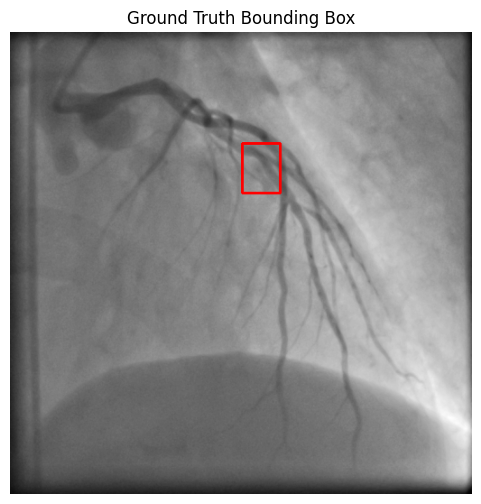

In [ ]:
# ==========================================================
# Bounding Box 시각화
# ==========================================================

import cv2
import matplotlib.pyplot as plt

# -----------------------------
# 이미지 경로
# -----------------------------
image_path = (
    CADICA_DIR /
    "selectedVideos" /
    sample.patient_id /
    sample.video_id /
    "input" /
    f"{txt_file.stem}.png"
)

print(image_path)

# 이미지 읽기
image = cv2.imread(str(image_path))

# OpenCV는 BGR이므로 RGB로 변환
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Bounding Box 읽기
with open(txt_file, "r") as f:

    line = f.readline().strip()

x, y, w, h, lesion_id = line.split()

x = int(x)
y = int(y)
w = int(w)
h = int(h)

# Bounding Box 그리기
cv2.rectangle(
    image,
    (x, y),
    (x + w, y + h),
    (255, 0, 0),
    2
)

plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.title("Ground Truth Bounding Box")
plt.show()

## 이미지 크기 확인

YOLO는 Bounding Box를 0~1 사이의 비율로 저장한다.

따라서 Bounding Box를 변환하기 전에
이미지의 가로(width)와 세로(height)를 확인한다.

In [ ]:
# 이미지 크기 확인
img = Image.open(image_path)

# 이미지 크기 (가로, 세로)
img_width, img_height = img.size

print(f"이미지 크기 : {img_width} x {img_height}")

이미지 크기 : 512 x 512


In [ ]:
# 이미지 크기 : 512 x 512
# BOUNDING BOX : 257 123 42 55 p0_20

#  CADICA Bounding Box를 YOLO 형식으로 변환

CADICA는 Bounding Box를

(x, y, width, height)

형태의 픽셀 좌표로 저장한다.

반면 YOLO는

(class, x_center, y_center, width, height)

형태의 정규화된 좌표를 사용한다.

따라서 CADICA Bounding Box를 YOLO 형식으로 변환한다.

In [ ]:
def convert_bbox_to_yolo(x, y, w, h, img_width, img_height):
  #bounding box 중심 좌표 계산
  x_center = x + (w / 2)
  y_center = y + (h / 2)
  # yolo 형식으로 정규화 (0~1  사이값)
  x_center /= img_width
  y_center /= img_height
  w /= img_width
  h /= img_height
  return x_center, y_center, w, h

# Detection dataset 생성

In [ ]:
## Lesion 영상: 모든 프레임 사용
## Bounding Box가 있는 프레임 → .txt에 라벨 저장
## Bounding Box가 없는 프레임 → 빈 .txt 생성
## Non-lesion 영상: 모든 프레임 사용
## 빈 .txt 생성

In [ ]:
# ground_truth_index
# gt가 존재하는 프레임이름을 set에 저장
# annotation이 있는지 없는지 빠르게 확인하기 위해

In [ ]:
# ground truth index 생성
def build_gt_index(gt_dir):
  gt_index = set()
  for txt_file in gt_dir.glob("*.txt"):
    gt_index.add(txt_file.stem) # txt제외한 파일명 저장
  return gt_index


In [ ]:
# 테스트
# Ground Truth Index 생성
gt_index = build_gt_index(gt_dir)

print(f"Ground Truth Frame 수 : {len(gt_index)}")

print("\n처음 10개")

for name in sorted(gt_index)[:10]:
    print(name)

Ground Truth Frame 수 : 13

처음 10개
p1_v2_00015
p1_v2_00016
p1_v2_00017
p1_v2_00018
p1_v2_00019
p1_v2_00021
p1_v2_00029
p1_v2_00030
p1_v2_00031
p1_v2_00032


In [ ]:
# process_video
# video 하나를 완전히 처리
# commmon_split 의 한 행을 입력받아 입력이미지와 gt를 이용하여 detection dataset 생성 (i)

In [ ]:
# ==========================================================
# Video 하나 처리
# ==========================================================

def process_video(row):

    # ----------------------------------------
    # 1. CSV 정보
    # ----------------------------------------
    patient_id = row["patient_id"]
    video_id = row["video_id"]
    split = row["split"]

    # ----------------------------------------
    # 2. input / groundtruth 경로
    # ----------------------------------------
    input_dir = (
        CADICA_DIR /
        "selectedVideos" /
        patient_id /
        video_id /
        "input"
    )

    gt_dir = (
        CADICA_DIR /
        "selectedVideos" /
        patient_id /
        video_id /
        "groundtruth"
    )

    # ----------------------------------------
    # 3. 이미지 목록
    # ----------------------------------------
    image_files = sorted(input_dir.glob("*.png"))

    # ----------------------------------------
    # 4. Ground Truth 목록
    # ----------------------------------------
    if gt_dir.exists():
      gt_index = build_gt_index(gt_dir)
    else:
      gt_index = set()

    # ----------------------------------------
    # 5. 모든 이미지 처리
    # ----------------------------------------
    for image_file in image_files:

        # 이미지 이름 (확장자 제외)
        image_name = image_file.stem

        # 출력 이미지 경로
        save_image = IMAGE_DIR / split / image_file.name

        # 출력 라벨 경로
        save_label = LABEL_DIR / split / f"{image_name}.txt"

        # 이후 단계에서
        # - 이미지 복사
        # - YOLO Label 생성
        # 을 수행한다.
        shutil.copy(image_file, save_image)
        if image_name in gt_index:
          annotation_file = gt_dir / f"{image_name}.txt"

          img = Image.open(image_file)
          img_width, img_height = img.size

          # YOLO LABEL 저장
          with open(annotation_file, "r") as f_in, open(save_label, "w") as f_out :
            for line in f_in:
              x, y, w, h, lesion_id = line.strip().split()
              x =int(x)
              y = int(y)
              w = int(w)
              h = int(h)

              # yolo 형식으로 변환
              x_center, y_center, width, height = convert_bbox_to_yolo(x, y, w, h, img_width, img_height)
              # 클래스는 lesion 하나이므로 항상 0
              f_out.write(
                  f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n"
                  )
        else:
          open(save_label, "w").close() # 빈 label 파일 생성

In [ ]:
print(df["label"].value_counts())

label
lesion        246
non-lesion     88
Name: count, dtype: int64


In [ ]:
# non-lesion 영상 하나 확인
non_lesion = df[df["label"] == "non-lesion"].iloc[0]

print(non_lesion)

patient_id                 p1
video_id                   v1
label              non-lesion
view                      LCA
n_frames                   55
has_groundtruth         False
split                   train
Name: 4, dtype: object


In [ ]:
patient_id = non_lesion["patient_id"]
video_id = non_lesion["video_id"]

input_dir = (
    CADICA_DIR /
    "selectedVideos" /
    patient_id /
    video_id /
    "input"
)

gt_dir = (
    CADICA_DIR /
    "selectedVideos" /
    patient_id /
    video_id /
    "groundtruth"
)

print("Input :", input_dir.exists())
print("Ground Truth :", gt_dir.exists())

Input : True
Ground Truth : False


In [ ]:
def build_detection_dataset(df):
  for _, row in tqdm(df.iterrows(), total = len(df)):
    process_video(row)
  print("detection dataset 생성 완료")

In [ ]:
# 테스트

# lesion 1개 + non-lesion 1개 테스트
test_df = pd.concat([
    df[df["label"] == "lesion"].head(1),
    df[df["label"] == "non-lesion"].head(1)
])

build_detection_dataset(test_df)

100%|██████████| 2/2 [00:51<00:00, 25.71s/it]

detection dataset 생성 완료


In [ ]:
import shutil

# 기존 Detection Dataset 삭제
if OUTPUT_DIR.exists():
    shutil.rmtree(OUTPUT_DIR)

# 다시 폴더 생성
IMAGE_DIR = OUTPUT_DIR / "images"
LABEL_DIR = OUTPUT_DIR / "labels"

for split in ["train", "val", "test"]:
    (IMAGE_DIR / split).mkdir(parents=True, exist_ok=True)
    (LABEL_DIR / split).mkdir(parents=True, exist_ok=True)

print("기존 테스트 데이터 삭제 완료")

기존 테스트 데이터 삭제 완료


In [ ]:
build_detection_dataset(df)

100%|██████████| 334/334 [2:09:50<00:00, 23.33s/it]

detection dataset 생성 완료


In [ ]:
# 확인
for split in ["train", "val", "test"]:
    image_count = len(list((IMAGE_DIR / split).glob("*.png")))
    label_count = len(list((LABEL_DIR / split).glob("*.txt")))

    print(f"{split}")
    print(f"Images : {image_count}")
    print(f"Labels : {label_count}")
    print("-" * 30)

train
Images : 13316
Labels : 13316
------------------------------
val
Images : 1396
Labels : 1396
------------------------------
test
Images : 1087
Labels : 1087
------------------------------


In [ ]:
# 라벨이 있는 파일 확인
# 라벨이 있는 파일 하나 확인
import random

label_files = list((LABEL_DIR / "train").glob("*.txt"))

while True:
    file = random.choice(label_files)

    if file.stat().st_size > 0:
        print(file.name)
        with open(file) as f:
            print(f.read())
        break

p18_v7_00019.txt
0 0.374023 0.239258 0.072266 0.056641



In [ ]:
# yaml 생성

yaml_text = f"""
path: {OUTPUT_DIR}

train: images/train
val: images/val
test: images/test

names:
  0: lesion
"""

yaml_path = OUTPUT_DIR / "dataset.yaml"

with open(yaml_path, "w") as f:
    f.write(yaml_text)

print("dataset.yaml 생성 완료")
print(yaml_path)

dataset.yaml 생성 완료
/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml


# YOLO Baseline

In [ ]:
# YOLO v8
from ultralytics import YOLO
model = YOLO("yolov8n.pt")
print(model)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): Bat

In [ ]:
# 학습 테스트
results = model.train(data = str(yaml_path),
                      epochs = 3,
                      imgsz = 512,
                      batch = 16,
                      project = str(PROJECT_DIR),
                      name = "YOLOv8_test",
                      exist_ok = True)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8_test, nbs=64, nms=False, opset=None, optim

In [ ]:
# 테스트용 best 모델

from ultralytics import YOLO

best_model = YOLO(f"{PROJECT_DIR}/YOLOv8_test/weights/best.pt")

print("Best Model Load 완료")

Best Model Load 완료


In [ ]:
# 테스트용 성능평가
metrics = best_model.val(data = str(yaml_path))
print(metrics)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.4±0.1 ms, read: 39.4±14.3 MB/s, size: 94.7 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset/labels/val.cache... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 344.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 88/88 3.8it/s 22.9s
                   all       1396        506      0.189     0.0672     0.0423     0.0138
Speed: 1.3ms preprocess, 2.9ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /content/runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array(

In [ ]:
# test 이미지 추론
best_model.predict(source = str(IMAGE_DIR / "test"),
                   save = True,
                   conf = 0.25)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00001.png: 512x512 (no detections), 20.7ms
image 2/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00002.png: 512x512 (no detections), 54.1ms
image 3/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00003.png: 512x512 (no detections), 36.1ms
image 4/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'lesion'}
 obb: None
 orig_img: array([[[ 5,  5,  5],
         [ 5,  5,  5],
         [ 3,  3,  3],
         ...,
         [27, 27, 27],
         [27, 27, 27],
         [30, 30, 30]],
 
        [[10, 10, 10],
         [ 8,  8,  8],
         [ 6,  6,  6],
         ...,
         [29, 29, 29],
         [29, 29, 29],
         [29, 29, 29]],
 
        [[ 6,  6,  6],
         [ 8,  8,  8],
         [ 8,  8,  8],
         ...,
         [29, 29, 29],
         [27, 27, 27],
         [25, 25, 25]],
 
        ...,
 
        [[ 5,  5,  5],
         [ 5,  5,  5],
         [ 5,  5,  5],
         ...,
         [ 8,  8,  8],
         [ 8,  8,  8],
         [ 6,  6,  6]],
 
        [[ 3,  3,  3],
         [ 1,  1,  1],
         [ 3,  3,  3],
         ...,
         [ 8,  8,  8],
         [ 8,  8,  8],
         [ 6,  6,  6]],
 
        [[ 3,  3,  3],
    

In [ ]:
# 결과 폴더 확인
print(os.listdir(PROJECT_DIR / "YOLOv8_test"))

# 최종 학습

In [ ]:
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
import ultralytics
print(ultralytics.__version__)

8.4.93


In [ ]:
print(model.overrides)

{'task': 'detect', 'data': '/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml', 'imgsz': 512, 'single_cls': False}


In [ ]:
# YOLO v8
from ultralytics import YOLO
model = YOLO("yolov8n.pt")
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
# 학습
results = model.train(data = str(yaml_path),
                      epochs = 50,
                      imgsz = 512,
                      batch = 16,
                      project = str(PROJECT_DIR),
                      name = "YOLOv8_detection",
                      exist_ok = True)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8_detection, nbs=64, nms=False, opset=None,

In [ ]:
# best 모델
from ultralytics import YOLO

best_model = YOLO(f"{PROJECT_DIR}/YOLOv8_detection/weights/best.pt")


In [ ]:
# 평가
metrics = best_model.val(data = str(yaml_path))
print(metrics)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.6±0.3 ms, read: 48.9±17.4 MB/s, size: 95.3 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset/labels/val.cache... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 325.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 88/88 3.5it/s 24.9s
                   all       1396        506      0.149      0.138     0.0564     0.0147
Speed: 1.4ms preprocess, 3.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/runs/detect/val-2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: arra

In [ ]:
# test 이미지 추론
best_model.predict(source = str(IMAGE_DIR / "test"),
                   save = True,
                   conf = 0.25)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00001.png: 512x512 (no detections), 8.3ms
image 2/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00002.png: 512x512 (no detections), 6.9ms
image 3/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/images/test/p28_v1_00003.png: 512x512 (no detections), 6.6ms
image 4/1087 /content/drive/MyDrive/DL_project/09_detection_dataset/ima

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'lesion'}
 obb: None
 orig_img: array([[[ 5,  5,  5],
         [ 5,  5,  5],
         [ 3,  3,  3],
         ...,
         [27, 27, 27],
         [27, 27, 27],
         [30, 30, 30]],
 
        [[10, 10, 10],
         [ 8,  8,  8],
         [ 6,  6,  6],
         ...,
         [29, 29, 29],
         [29, 29, 29],
         [29, 29, 29]],
 
        [[ 6,  6,  6],
         [ 8,  8,  8],
         [ 8,  8,  8],
         ...,
         [29, 29, 29],
         [27, 27, 27],
         [25, 25, 25]],
 
        ...,
 
        [[ 5,  5,  5],
         [ 5,  5,  5],
         [ 5,  5,  5],
         ...,
         [ 8,  8,  8],
         [ 8,  8,  8],
         [ 6,  6,  6]],
 
        [[ 3,  3,  3],
         [ 1,  1,  1],
         [ 3,  3,  3],
         ...,
         [ 8,  8,  8],
         [ 8,  8,  8],
         [ 6,  6,  6]],
 
        [[ 3,  3,  3],
    

In [ ]:
import glob
from IPython.display import Image, display
result_images = sorted(glob.glob(f"{PROJECT_DIR}/YOLOv8_detection/predict/*.jpg"))
print(f"생성된 결과 이미지 :{len(result_images)}")

if result_images:
  display(Image(filename = result_images[0]))

생성된 결과 이미지 :0


In [ ]:
# best 모델
from ultralytics import YOLO

best_model = YOLO(f"{PROJECT_DIR}/YOLOv8_detection/weights/best.pt")

# 평가
metrics = best_model.val(data=str(yaml_path))
print(metrics)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 3.4±3.3 ms, read: 13.3±6.5 MB/s, size: 103.2 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset/labels/val.cache... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 266.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 88/88 3.5it/s 25.3s
                   all       1396        506      0.149      0.138     0.0564     0.0147
Speed: 1.4ms preprocess, 3.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/runs/detect/val-3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: arra

In [ ]:
# ==========================================================
# Baseline (YOLOv8n + 512) Evaluation
# ==========================================================

from ultralytics import YOLO

# Best 모델 로드
best_model = YOLO(f"{PROJECT_DIR}/YOLOv8_detection/weights/best.pt")

# 평가
metrics = best_model.val(data=str(yaml_path), verbose=False)

print("=" * 50)
print("        YOLOv8n Baseline Evaluation")
print("=" * 50)
print(f"Precision     : {metrics.box.mp:.4f}")
print(f"Recall        : {metrics.box.mr:.4f}")
print(f"mAP@50        : {metrics.box.map50:.4f}")
print(f"mAP@50-95     : {metrics.box.map:.4f}")
print("=" * 50)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.5±0.1 ms, read: 31.0±12.7 MB/s, size: 94.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset/labels/val.cache... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 254.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 88/88 3.2it/s 27.2s
                   all       1396        506      0.149      0.138     0.0564     0.0147
Speed: 1.4ms preprocess, 3.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /content/runs/detect/val-4
        YOLOv8n Baseline Evaluation
Precision     : 0.1490
Recall        : 0.1383


# Baseline Improvement 1 - YOLOv8s +  이미지 사이즈 640

In [ ]:
# 모델 변경
from ultralytics import YOLO

model = YOLO("yolov8s.pt")
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
# YOLOv8s + 640

results = model.train(data=str(yaml_path),
                      epochs=50,
                      imgsz=640,
                      batch=16,
                      project=str(PROJECT_DIR),
                      name="YOLOv8s_640",
                      exist_ok=True)

Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8s_640, nbs=64, nms=False, opset=None, opti

Exception in thread Thread-77 (_pin_memory_loop):
Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/pin_memory.py", line 52, in _pin_memory_loop


KeyboardInterrupt: 

    do_one_step()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/pin_memory.py", line 28, in do_one_step
    r = in_queue.get(timeout=MP_STATUS_CHECK_INTERVAL)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/multiprocessing/reductions.py", line 540, in rebuild_storage_fd
    fd = df.detach()
         ^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/resource_sharer.py", line 57, in detach
    with _resource_sharer.get_connection(self._id) as conn:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/resource_sharer.py", line 86, in get_connection
    c = Client(address, authkey=process.current_process().authkey)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/mu

In [ ]:
from pathlib import Path

label_dir = Path(TRAIN_LABEL_DIR)

positive = 0
negative = 0

for txt in label_dir.glob("*.txt"):
    if txt.stat().st_size == 0:
        negative += 1
    else:
        positive += 1

print("="*40)
print(f"Positive images : {positive}")
print(f"Negative images : {negative}")
print(f"Total           : {positive+negative}")
print("="*40)

NameError: name 'TRAIN_LABEL_DIR' is not defined

# Data Augmentation - Lesion Oversampling
- 새 데이터셋(09_detection_dataset_aug) 생성
- CLAHE, Brightness / Contrast 랜덤 적용

In [ ]:
import os
import cv2
import random
import shutil
from pathlib import Path
import albumentations as A

In [ ]:
# 원본 데이터 새 데이터 경로 지정
PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")

SRC_DATASET = PROJECT_DIR / "09_detection_dataset"
DST_DATASET = PROJECT_DIR / "09_detection_dataset_aug"

In [ ]:
# 새 데이터셋 생성
import shutil

# 기존 aug 폴더가 있으면 삭제
if DST_DATASET.exists():
    shutil.rmtree(DST_DATASET)

# 원본 데이터셋 전체 복사
shutil.copytree(SRC_DATASET, DST_DATASET)

print("09_detection_dataset_aug 생성 완료")

09_detection_dataset_aug 생성 완료


In [ ]:
# 데이터셋 확인
from pathlib import Path

TRAIN_LABEL_DIR = DST_DATASET / "labels" / "train"

label_files = list(TRAIN_LABEL_DIR.glob("*.txt"))

background = 0
lesion = 0

for txt in label_files:
    if txt.stat().st_size == 0:
        background += 1
    else:
        lesion += 1

print("="*40)
print(f"전체 train 이미지 : {len(label_files)}")
print(f"Background       : {background}")
print(f"Lesion           : {lesion}")
print("="*40)

전체 train 이미지 : 13316
Background       : 10239
Lesion           : 3077


In [ ]:
# 랜덤 증강 테스트

# 병변 이미지 목록 만들기
import random
from pathlib import Path

TRAIN_IMG_DIR = DST_DATASET / "images" / "train"
TRAIN_LABEL_DIR = DST_DATASET / "labels" / "train"

lesion_files = []

for txt_path in TRAIN_LABEL_DIR.glob("*.txt"):

    # 빈 txt(background)는 제외
    if txt_path.stat().st_size == 0:
        continue

    img_path = TRAIN_IMG_DIR / (txt_path.stem + ".png")

    if img_path.exists():
        lesion_files.append((img_path, txt_path))

print(f"병변 이미지 수 : {len(lesion_files)}")

병변 이미지 수 : 3077


In [ ]:
# 랜덤 5장 만들기
sample = random.sample(lesion_files, 5)

for img, txt in sample:
    print(img.name)

p24_v2_00022.png
p36_v14_00025.png
p18_v3_00042.png
p32_v10_00033.png
p14_v1_00014.png


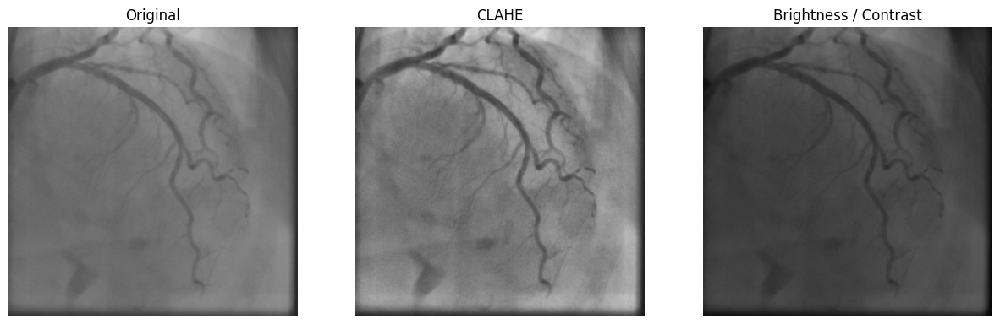

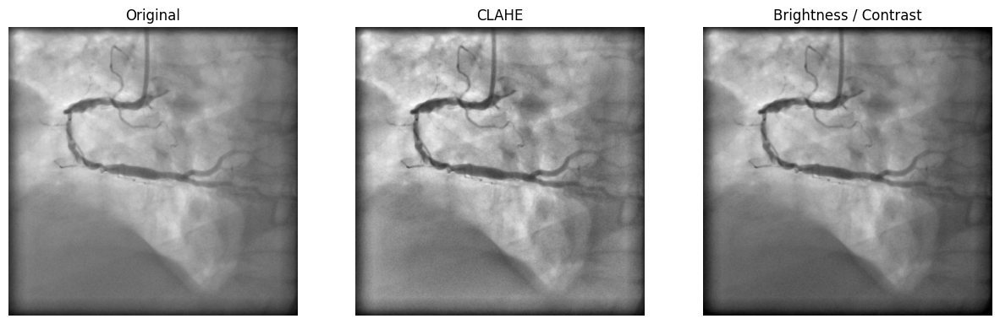

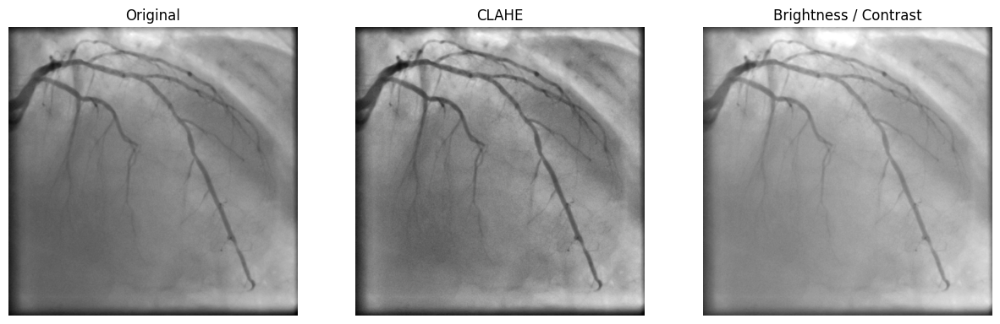

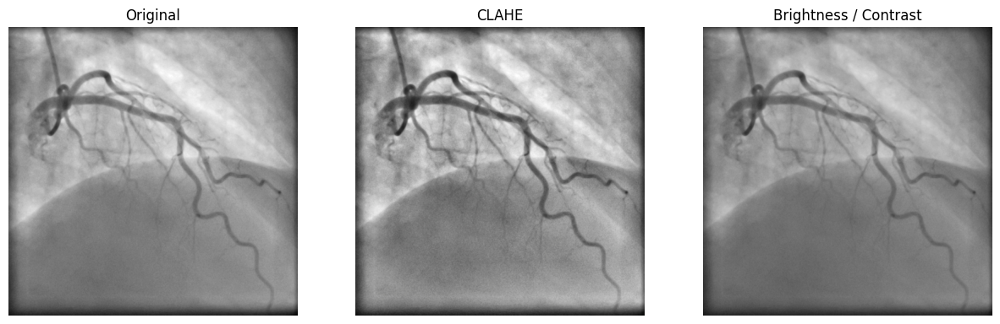

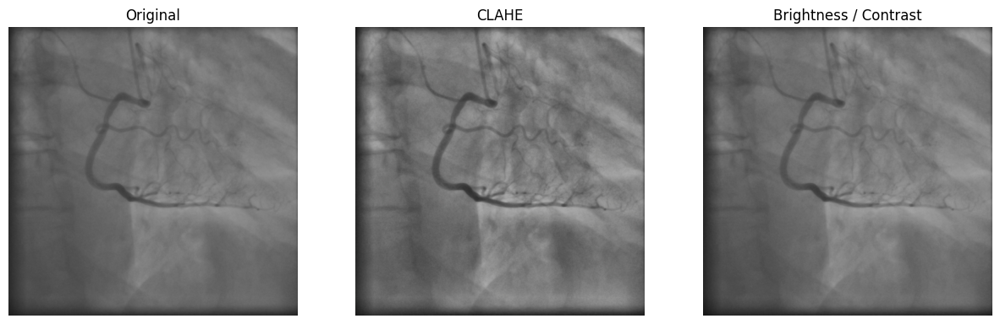

In [ ]:
# 랜덤 5장 선택해서 화면으로 출력
import random
import cv2
import matplotlib.pyplot as plt
import albumentations as A

# CLAHE
clahe = A.Compose([
    A.CLAHE(
        clip_limit=2.0,
        tile_grid_size=(8,8),
        p=1.0
    )
])

# Brightness / Contrast
bc = A.Compose([
    A.RandomBrightnessContrast(
        brightness_limit=0.2,
        contrast_limit=0.2,
        p=1.0
    )
])

# 병변 이미지 5장 선택
samples = random.sample(lesion_files, 5)

for img_path, _ in samples:

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_clahe = clahe(image=img)["image"]
    img_bc = bc(image=img)["image"]

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(img_clahe)
    plt.title("CLAHE")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(img_bc)
    plt.title("Brightness / Contrast")
    plt.axis("off")

    plt.show()

In [ ]:
# brightness contrast 약간 어두워지는 경향 -> 0.1로 줄일 것

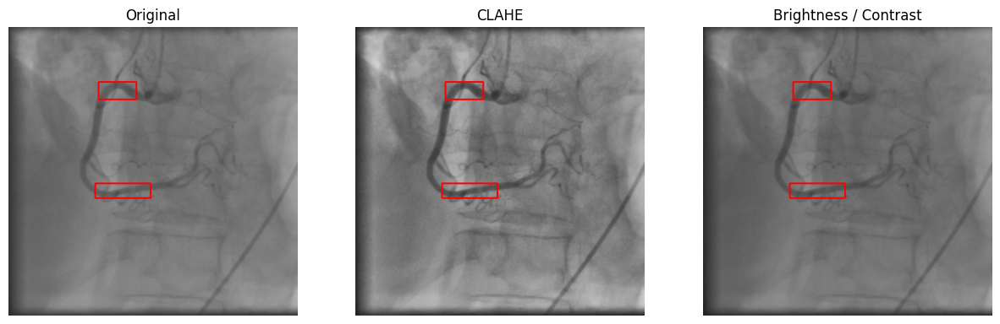

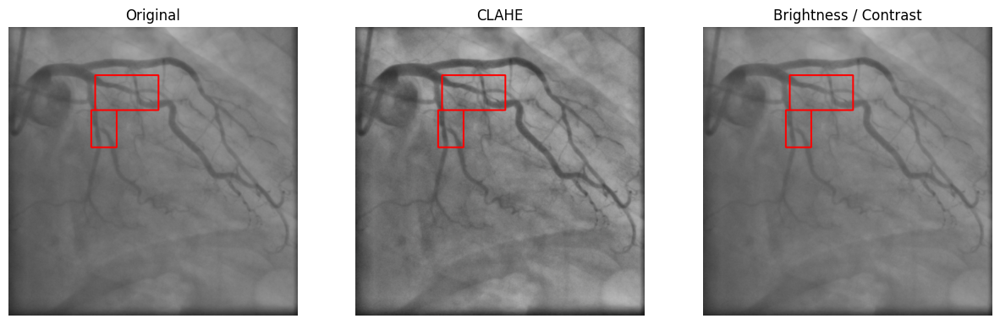

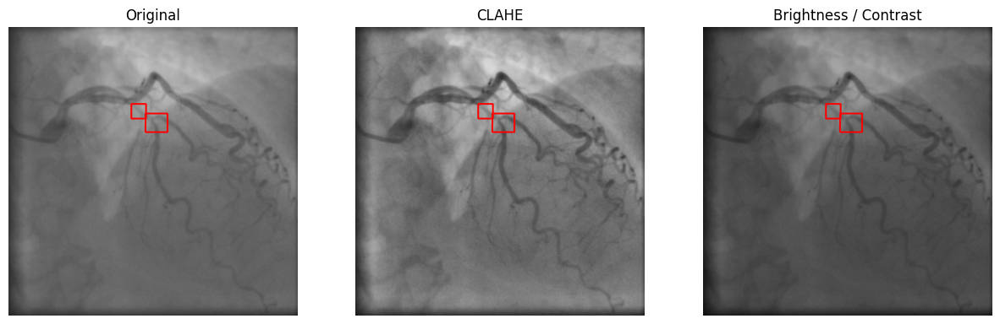

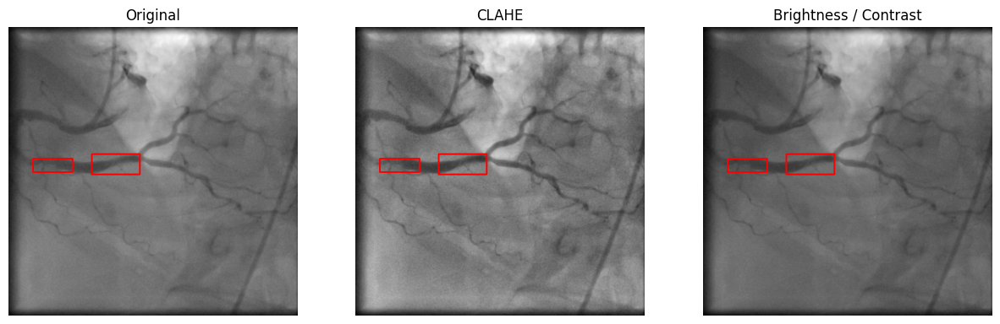

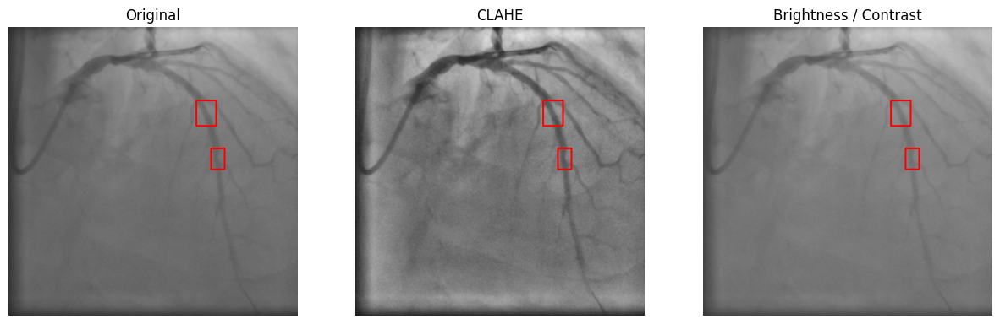

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt
import albumentations as A

# -------------------------------
# Augmentation
# -------------------------------
clahe = A.Compose([
    A.CLAHE(
        clip_limit=2.0,
        tile_grid_size=(8,8),
        p=1.0
    )
])

bc = A.Compose([
    A.RandomBrightnessContrast(
        brightness_limit=0.1,
        contrast_limit=0.1,
        p=1.0
    )
])

# -------------------------------
# Bounding Box 그리기 함수
# -------------------------------
def draw_boxes(img, label_path):

    img_box = img.copy()
    h, w = img.shape[:2]

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        if line.strip() == "":
            continue

        cls, x, y, bw, bh = map(float, line.split())

        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cv2.rectangle(
            img_box,
            (x1,y1),
            (x2,y2),
            (255,0,0),
            2
        )

    return img_box


# -------------------------------
# 랜덤 5장 선택
# -------------------------------
samples = random.sample(lesion_files, 5)

for img_path, txt_path in samples:

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_clahe = clahe(image=img)["image"]
    img_bc = bc(image=img)["image"]

    img_org_box = draw_boxes(img, txt_path)
    img_clahe_box = draw_boxes(img_clahe, txt_path)
    img_bc_box = draw_boxes(img_bc, txt_path)

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img_org_box)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(img_clahe_box)
    plt.title("CLAHE")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(img_bc_box)
    plt.title("Brightness / Contrast")
    plt.axis("off")

    plt.show()

# 본 데이터 증강
- CLAHE (clip_limit = 2.0, tile_grid_size = (8,8))
- brightnessContrast (brightness_limit = 0.1, contrast_limit = 0.1)

In [ ]:
# 본 데이터 증강
import random
import shutil
import cv2
import albumentations as A

# -----------------------------
# Augmentation 정의
# -----------------------------
clahe = A.CLAHE(
    clip_limit=2.0,
    tile_grid_size=(8,8),
    p=1.0
)

brightness = A.RandomBrightnessContrast(
    brightness_limit=0.1,
    contrast_limit=0.1,
    p=1.0
)

augmentations = [clahe, brightness]

save_count = 0

for img_path, txt_path in lesion_files:

    img = cv2.imread(str(img_path))

    # 랜덤으로 하나 선택
    aug = random.choice(augmentations)

    aug_img = aug(image=img)["image"]

    # 저장 이름
    new_img_name = img_path.stem + "_aug.png"
    new_txt_name = txt_path.stem + "_aug.txt"

    new_img_path = img_path.parent / new_img_name
    new_txt_path = txt_path.parent / new_txt_name

    # 이미지 저장
    cv2.imwrite(str(new_img_path), aug_img)

    # txt 그대로 복사
    shutil.copy(txt_path, new_txt_path)

    save_count += 1

print("="*40)
print(f"생성된 증강 이미지 : {save_count}")
print("Augmentation 완료")
print("="*40)


생성된 증강 이미지 : 3077
Augmentation 완료


In [ ]:
# 데이터셋 무결성 확인
from pathlib import Path

TRAIN_IMG_DIR = DST_DATASET / "images" / "train"
TRAIN_LABEL_DIR = DST_DATASET / "labels" / "train"

img_count = len(list(TRAIN_IMG_DIR.glob("*.png")))
txt_count = len(list(TRAIN_LABEL_DIR.glob("*.txt")))

print("="*40)
print(f"Train Images : {img_count}")
print(f"Train Labels : {txt_count}")
print("="*40)

Train Images : 16393
Train Labels : 16393


In [ ]:
# 병변 개수 확인
background = 0
lesion = 0

for txt in TRAIN_LABEL_DIR.glob("*.txt"):

    if txt.stat().st_size == 0:
        background += 1
    else:
        lesion += 1

print("="*40)
print(f"Background : {background}")
print(f"Lesion     : {lesion}")
print("="*40)

Background : 10239
Lesion     : 6154


In [ ]:
# dataset.yaml 확인
from pathlib import Path

yaml_path_aug = PROJECT_DIR / "09_detection_dataset_aug" / "dataset.yaml"

with open(yaml_path_aug, "r") as f:
    print(f.read())


path: /content/drive/MyDrive/DL_project/09_detection_dataset

train: images/train
val: images/val
test: images/test

names:
  0: lesion



In [ ]:
# dataset.yaml 수정

import yaml

yaml_path_aug = PROJECT_DIR / "09_detection_dataset_aug" / "dataset.yaml"

with open(yaml_path_aug, "r") as f:
    data = yaml.safe_load(f)

data["train"] = str(PROJECT_DIR / "09_detection_dataset_aug" / "images" / "train")
data["val"] = str(PROJECT_DIR / "09_detection_dataset_aug" / "images" / "val")
data["test"] = str(PROJECT_DIR / "09_detection_dataset_aug" / "images" / "test")

with open(yaml_path_aug, "w") as f:
    yaml.dump(data, f, sort_keys=False)

print(" dataset.yaml 수정 완료")

 dataset.yaml 수정 완료


In [ ]:
# 확인
with open(yaml_path_aug, "r") as f:
    print(f.read())

path: /content/drive/MyDrive/DL_project/09_detection_dataset
train: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/train
val: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/val
test: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/test
names:
  0: lesion



In [ ]:
# path 수정
import yaml

with open(yaml_path_aug, "r") as f:
    data = yaml.safe_load(f)

data["path"] = str(PROJECT_DIR / "09_detection_dataset_aug")

with open(yaml_path_aug, "w") as f:
    yaml.dump(data, f, sort_keys=False)

print(" path 수정 완료")

 path 수정 완료


In [ ]:
with open(yaml_path_aug, "r") as f:
    print(f.read())

path: /content/drive/MyDrive/DL_project/09_detection_dataset_aug
train: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/train
val: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/val
test: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/test
names:
  0: lesion



# 증강 데이터셋 학습 YOLOv8s + 640

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8s.pt")

results = model.train(data=str(yaml_path_aug),
                      epochs=50,
                      imgsz=640,
                      batch=16,
                      patience=10,
                      project=str(PROJECT_DIR),
                      name="YOLOv8s_640_aug",
                      exist_ok=True)

New https://pypi.org/project/ultralytics/8.4.94 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.93 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset_aug/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov

Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 270, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 427, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 384, in _send
    n = write(self._handle, buf)
        ^^^^^^^^^^^^^^^^^^^^^^^^
OSError: [Errno 9] Bad file descriptor
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exc

train: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset_aug/labels/train... 16393 images, 10239 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 16393/16393 58.1it/s 4:42
train: New cache created: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ val: Slow image access detected (ping: 2.0±1.6 ms, read: 9.5±6.0 MB/s, size: 94.5 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset_aug/labels/val... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 79.2it/s 17.6s
val: New cache created: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/labels/val.ca

In [ ]:
# 평가
from ultralytics import YOLO

best_model = YOLO(f"{PROJECT_DIR}/YOLOv8s_640_aug/weights/best.pt")

metrics = best_model.val(data=str(yaml_path_aug))

print("="*50)
print("YOLOv8s + Oversampling")
print("="*50)
print(f"Precision : {metrics.box.mp:.4f}")
print(f"Recall    : {metrics.box.mr:.4f}")
print(f"mAP@50    : {metrics.box.map50:.4f}")
print(f"mAP@50-95 : {metrics.box.map:.4f}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.6±0.2 ms, read: 0.2±0.0 MB/s, size: 101.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/drive/MyDrive/DL_project/09_detection_dataset_aug/labels/val.cache... 1396 images, 1061 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1396/1396 216.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8

# 하이퍼파라미터 튜닝

In [ ]:
from pathlib import Path

PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")
yaml_path_aug = PROJECT_DIR / "09_detection_dataset_aug" / "dataset.yaml"

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO("yolov8s.pt")

results = model.train(data=str(yaml_path_aug),
                      epochs=50,
                      patience=10,
                      imgsz=768,
                      batch=16,
                      optimizer="AdamW",
                      lr0=0.003,
                      project=str(PROJECT_DIR),
                      name="YOLOv8s_768_AdamW_lr0003_L4",
                      exist_ok=True)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset_aug/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=768, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8s_768_AdamW_lr0003_L4, nbs=64, nms=F

KeyboardInterrupt: 

# 2 stage Learning

## stage 0 - Lesion Only pretraining
- 병변데이터만 학습시켜서 바운딩박스 잘 찾는지 확인하기

In [ ]:

from pathlib import Path
import shutil

PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")

SRC_DATASET = PROJECT_DIR / "09_detection_dataset"
DST_DATASET = PROJECT_DIR / "09_detection_dataset_lesion"

# 처음 만들 때는 복사만
shutil.copytree(SRC_DATASET, DST_DATASET)

print("복사 완료!")

복사 완료!


In [ ]:
# 데이터셋 txt 확인
from pathlib import Path

lbl_dir = Path("/content/drive/MyDrive/DL_project/09_detection_dataset/labels/train")

empty = 0
nonempty = 0

for f in lbl_dir.glob("*.txt"):
    if f.read_text().strip() == "":
        empty += 1
    else:
        nonempty += 1

print("빈 txt :", empty)
print("bbox txt :", nonempty)

빈 txt : 10239
bbox txt : 3077


In [ ]:
# 정상 데이터 (빈 txt 파일 삭제 )

from pathlib import Path

for split in ["train", "val", "test"]:

    img_dir = DST_DATASET / "images" / split
    lbl_dir = DST_DATASET / "labels" / split

    removed = 0

    for img_path in img_dir.glob("*.png"):

        txt_path = lbl_dir / f"{img_path.stem}.txt"

        # 빈 txt = 정상 프레임
        if txt_path.exists() and txt_path.read_text().strip() == "":

            img_path.unlink()
            txt_path.unlink()

            removed += 1

    print(f"{split}: {removed}개 삭제")



train: 10239개 삭제
val: 1061개 삭제
test: 814개 삭제


In [ ]:
# 병변 전용 데이터셋 확인
from pathlib import Path

for split in ["train", "val", "test"]:

    img_dir = DST_DATASET / "images" / split
    lbl_dir = DST_DATASET / "labels" / split

    n_img = len(list(img_dir.glob("*.png")))
    n_lbl = len(list(lbl_dir.glob("*.txt")))

    empty = 0
    for f in lbl_dir.glob("*.txt"):
        if f.read_text().strip() == "":
            empty += 1

    print("=" * 40)
    print(split)
    print("images :", n_img)
    print("labels :", n_lbl)
    print("empty txt :", empty)

train
images : 3077
labels : 3077
empty txt : 0
val
images : 335
labels : 335
empty txt : 0
test
images : 273
labels : 273
empty txt : 0


In [ ]:
# dataset.yaml 수정
import yaml
yaml_path = DST_DATASET / "dataset.yaml"
data = {"path": str(DST_DATASET),
        "train": "images/train",
        "val": "images/val",
        "test": "images/test",
        "names": {0: "lesion"}}

with open(yaml_path, "w") as f:
  yaml.dump(data, f)
print("dataset.yaml 생성 완료")

dataset.yaml 생성 완료


In [ ]:
# 학습
model = YOLO("yolov8s.pt")
results = model.train(data = str(DST_DATASET/"dataset.yaml"),
                      epochs = 50,
                      imgsz = 512,
                      batch = 16,
                      patience = 10,
                      project = str(PROJECT_DIR),
                      name = "YOLOv8_lesion_only",
                      exist_ok = True)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset_lesion/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8_lesion_only, nbs=64, nms=False, o

In [ ]:
from pathlib import Path

result_dir = PROJECT_DIR / "YOLOv8_lesion_only"

print(result_dir.exists())
print(list(result_dir.iterdir()))

True
[PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/weights'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/args.yaml'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/labels.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/train_batch0.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/train_batch1.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/train_batch2.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/results.csv'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/val_batch0_labels.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/val_batch0_pred.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/val_batch1_labels.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/val_batch1_pred.jpg'), PosixPath('/content/drive/MyDrive/DL_project/YOLOv8_lesion_only/val_batch2_labels

In [ ]:
# best.pt 예측
from ultralytics import YOLO
from pathlib import Path

PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")
DST_DATASET = PROJECT_DIR / "09_detection_dataset_lesion"

model = YOLO(PROJECT_DIR / "YOLOv8_lesion_only/weights/best.pt")

In [ ]:
# test 이미지 10장 예측
results = model.predict(
    source=str(DST_DATASET / "images" / "test"),
    conf=0.25,
    save=False,
    verbose=False
)

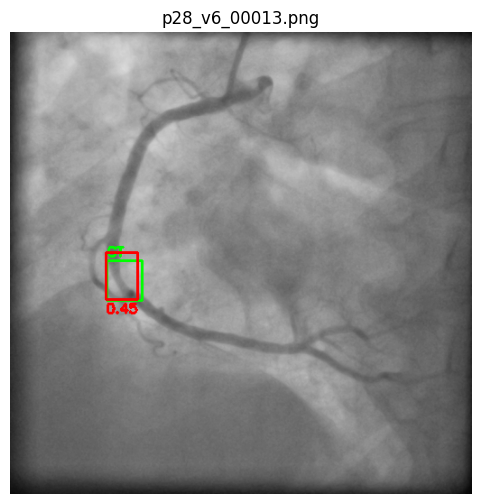

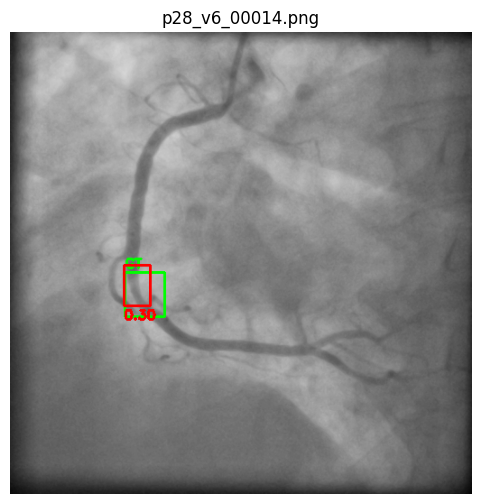

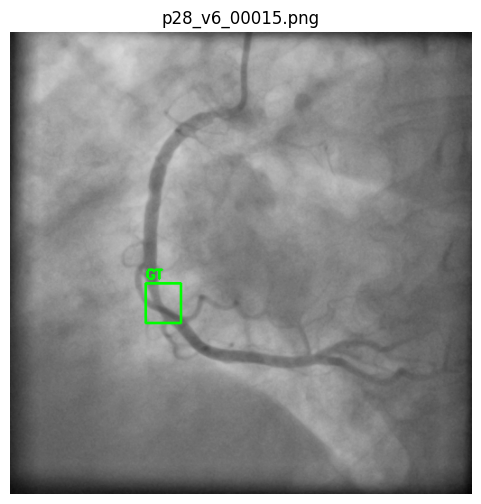

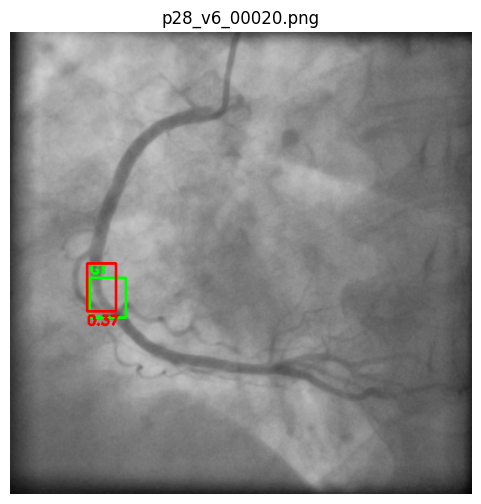

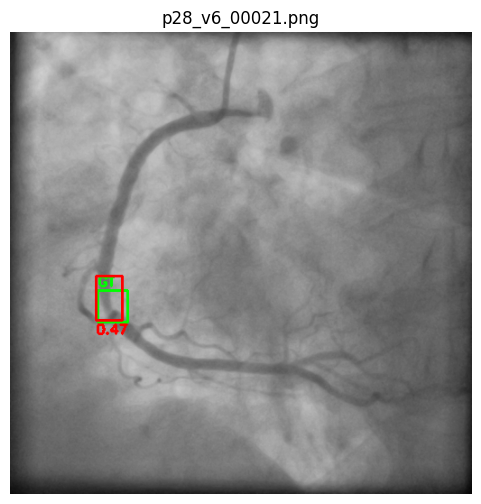

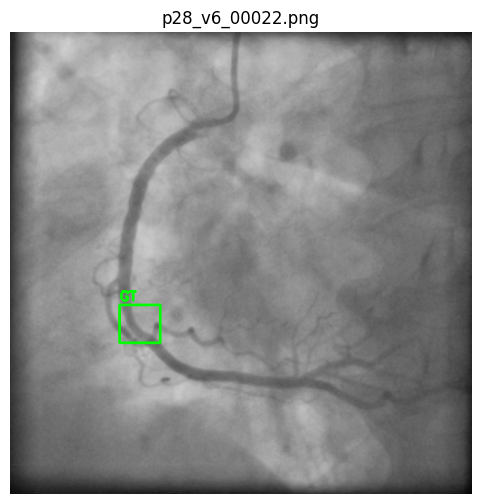

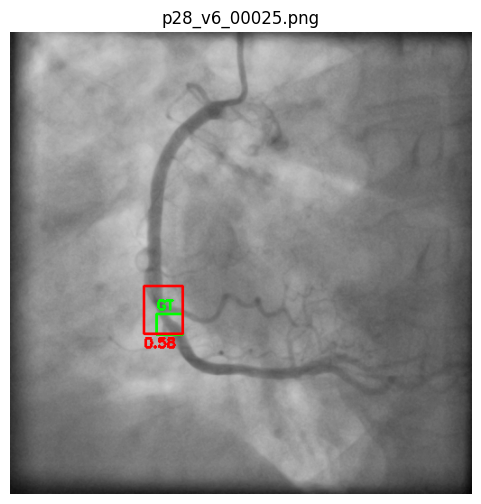

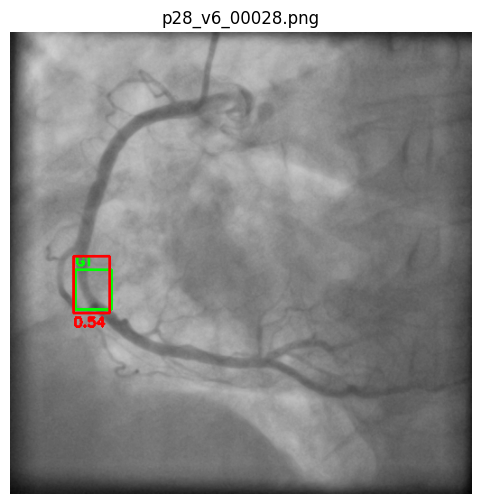

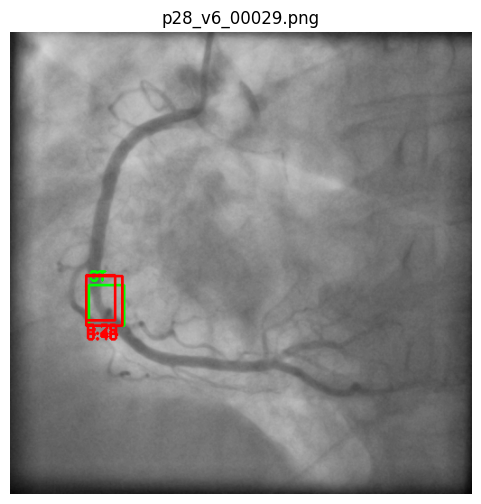

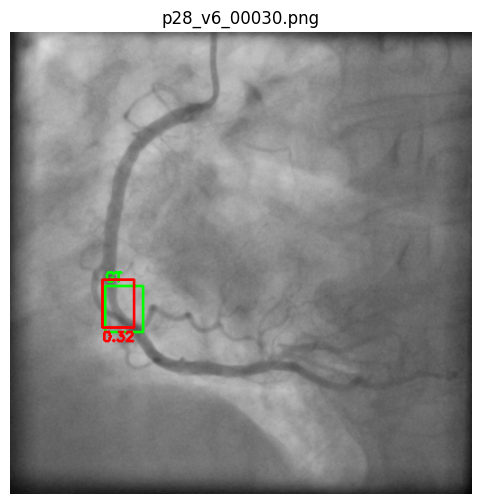

In [ ]:
# Ground Truth와 예측 비교
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

image_dir = DST_DATASET / "images" / "test"
label_dir = DST_DATASET / "labels" / "test"

image_paths = sorted(image_dir.glob("*.png"))

for idx in range(min(10, len(results))):

    img_path = image_paths[idx]

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w = img.shape[:2]

    # -------------------------
    # Ground Truth (초록)
    # -------------------------
    gt_file = label_dir / (img_path.stem + ".txt")

    if gt_file.exists():

        for line in gt_file.read_text().strip().splitlines():

            if line == "":
                continue

            cls, xc, yc, bw, bh = map(float, line.split())

            x1 = int((xc - bw/2)*w)
            y1 = int((yc - bh/2)*h)
            x2 = int((xc + bw/2)*w)
            y2 = int((yc + bh/2)*h)

            cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2)
            cv2.putText(img,"GT",(x1,y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.5,(0,255,0),2)

    # -------------------------
    # Prediction (빨강)
    # -------------------------
    boxes = results[idx].boxes

    for box in boxes:

        x1,y1,x2,y2 = box.xyxy[0].cpu().numpy().astype(int)

        conf = float(box.conf)

        cv2.rectangle(img,(x1,y1),(x2,y2),(255,0,0),2)

        cv2.putText(img,
                    f"{conf:.2f}",
                    (x1,y2+15),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    (255,0,0),
                    2)

    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_path.name)
    plt.show()


# Stage 1 - Fine-tuning Full Dataset

In [ ]:
# stage 1
# 원본 데이터셋
from pathlib import Path
from ultralytics import YOLO

PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")
DATASET = PROJECT_DIR / "09_detection_dataset_aug"

In [ ]:
# 학습
model = YOLO("yolov8s.pt")

results = model.train(
    data=str(DATASET / "dataset.yaml"),
    epochs=50,
    imgsz=512,
    batch=16,
    patience=10,
    project=str(PROJECT_DIR),
    name="YOLOv8_baseline_aug",
    exist_ok=True
)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset_aug/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv8_baseline_aug, nbs=64, nms=False, ops

KeyboardInterrupt: 

In [ ]:
from pathlib import Path

DATASET = Path("/content/drive/MyDrive/DL_project/09_detection_dataset_aug")

for split in ["train","val","test"]:

    img = len(list((DATASET/"images"/split).glob("*.png")))
    lbl = len(list((DATASET/"labels"/split).glob("*.txt")))

    print(split, img, lbl)

train 16393 16393
val 1396 1396
test 1087 1087


In [ ]:
from pathlib import Path

print((DATASET/"dataset.yaml").read_text())

path: /content/drive/MyDrive/DL_project/09_detection_dataset_aug
train: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/train
val: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/val
test: /content/drive/MyDrive/DL_project/09_detection_dataset_aug/images/test
names:
  0: lesion



# YOLOv12

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 63.2 MB/s eta 0:00:00


In [ ]:
# 라이브러리 import
import os
from pathlib import Path # 파일경로 관리
import pandas as pd # 데이터 처리
import numpy as np
from PIL import Image # 이미지 처리
from tqdm import tqdm # 진행률 표시
import shutil

In [ ]:
PROJECT_DIR = Path("/content/drive/MyDrive/DL_project")

DATASET = PROJECT_DIR / "09_detection_dataset"
yaml_path = DATASET / "dataset.yaml"

In [ ]:
from ultralytics import YOLO
model = YOLO("yolo12s.pt")
print(model)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): Ba

In [ ]:
import ultralytics
print(ultralytics.__version__)

8.4.95


In [ ]:
results = model.train(data = str(yaml_path),
                      epochs = 50,
                      imgsz = 640,
                      batch = 16,
                      patience = 10,
                      project = str(PROJECT_DIR),
                      name = "YOLOv12s_detection",
                      exist_ok = True)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DL_project/09_detection_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv12s_detection, nbs=64, nms=False, opset=No